# Лабораторная работа №2 (Методы первого и высших порядков)

*Широких Николай Александрович*

*Коршунов Илья Константинович*

#### Задача
Задача работы – реализовать методы оптимизации первого и высших порядков и исследовать сравнить их эффективность в разных ситуациях.

## Основной код

In [1]:
import matplotlib as mpl
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.pyplot as plt

import scipy
import numpy as np
import sympy as sp
import pandas as pd

import inspect
from IPython import display
import random
from functools import partial

mpl.rcParams["figure.dpi"] = 200
DEFAULT_EPS = 1e-3
GLOBAL_MIN = {}

In [23]:
class util:
    def lambdify(f):
        if callable(f):
            return f
        sym = tuple(sorted(f.free_symbols, key=lambda s: s.name))
        lambdified = util.call_counted(sp.lambdify(sym, f))
        lambdified.expr = f
        lambdified.hessian = util.call_counted(sp.lambdify(sym, sp.hessian(f, sym)))
        lambdified.grad = util.call_counted(util.grad(f, sym))
        lambdified.all_calls = lambda: lambdified.calls + lambdified.hessian.calls + lambdified.grad.calls
        return lambdified

    def call_counted(f):
        def wrapped(*args, **kwargs):
            wrapped.calls += 1
            return f(*args, **kwargs)

        wrapped.calls = 0
        return wrapped

    def grad(f, sym=None):
        if sym is None:
            sym = f.free_symbols
        vector = tuple(f.diff(var) for var in sym)
        return lambda point: np.array(
            list(map(lambda var: complex(var.subs(zip(sym, point))).real, vector))
        )

    def is_3d(f):
        return len(inspect.signature(util.lambdify(f)).parameters) == 2

    def format_point(point):
        if point is None:
            return "none"
        if all(isinstance(p, int) for p in point):
            return ", ".join(str(p) for p in point)
        return ", ".join(f"{p:.2e}" for p in point)

In [3]:
class plotter:
    def __init__(self, f) -> None:
        self.f = util.lambdify(f)

    def figure(self, angle=(45, 15), figsize=(14, 8)):
        fig = plt.figure(figsize=figsize)
        self.ax3d = fig.add_subplot(121, projection="3d")
        self.ax3d.set_axis_off()

        self.axc = fig.add_subplot(122)
        self.ax3d.view_init(*angle)
        return self

    def plot3d(self, center=(0, 0), radius=1):
        X = np.linspace(center[0] - radius, center[0] + radius, 100)
        Y = np.linspace(center[1] - radius, center[1] + radius, 100)
        X, Y = np.meshgrid(X, Y)
        Z = self.f(X, Y)
        self.ax3d.plot_surface(X, Y, Z, alpha=0.45, cmap="viridis", edgecolor="none")
        self.axc.contour(X, Y, Z, 40)
        return self

    def plot_steps(self, points, color=None, l=None):
        points = np.array(points)
        X, Y = points[:, 0], points[:, 1]
        Z = self.f(X, Y)

        self.ax3d.plot(
            X, Y, Z, color=color, linewidth=1, marker="o", markersize=2, label=l
        )
        self.axc.plot(X, Y, marker="o", linewidth=1, markersize=2, color=color)

        if l is not None:
            self.ax3d.legend(loc="upper right")
        return self

In [4]:
class search1d:
    def golden_section(f, a, b, eps=DEFAULT_EPS):
        T = (1 + 5**0.5) / 2
        f = util.lambdify(f)

        f_left = f(a + (b - a) / T)
        f_right = f(b - (b - a) / T)

        while b - a > eps:
            if f_right > f_left:
                a = b - (b - a) / T
                f_right = f_left
                f_left = f(a + (b - a) / T)
            else:
                b = a + (b - a) / T
                f_left = f_right
                f_right = f(b - (b - a) / T)

        return (a + b) / 2

search1d.golden_section.name = "1d search"

In [5]:
class minimize_result:
    def __init__(
        self, func, opt, iterations, steps, eps, start, method
    ) -> None:
        self.func = func
        self.opt = opt
        self.iterations = iterations
        self.steps = steps
        self.eps = eps
        self.start = start
        self.method = method
        if self.success():
            if func.expr in GLOBAL_MIN:
                self.deviation = np.linalg.norm(np.array(opt) - GLOBAL_MIN[func.expr])
                self.deviation = util.format_point((self.deviation,))
            else:
                self.deviation = "unknown"
        else:
            self.deviation = float("inf")

    def cols():
        return [
            "func",
            "x0",
            "optimum",
            "deviation",
            "iter",
            "evals",
            "eps",
            "method",
        ]

    def row(self):
        return [
            self.func.expr,
            util.format_point(self.start),
            util.format_point(self.opt),
            self.deviation,
            self.iterations,
            self.func.all_calls(),
            self.eps,
            self.method,
        ]

    def success(self) -> bool:
        return self.opt is not None

In [6]:
class gradient_step:
    def learning_rate(lr):
        def next_step(f, x, grad, eps):
            return x - lr * grad

        next_step.name = f"lr={lr}"
        return next_step

    def search(s=search1d.golden_section):
        def next_step(f, x, grad, eps):
            alpha = s(lambda alpha: f(*(x - alpha * grad)), 0, 1, eps=eps)
            return x - alpha * grad

        next_step.name = "with " + s.name
        return next_step


class newton_step:
    def learning_rate(lr=1):
        def next_step(f, x, grad, eps):
            return x - lr * np.linalg.inv(f.hessian(*x)) @ grad

        next_step.name = f"Newton lr={lr}"
        return next_step
    
    def search(s=search1d.golden_section):
        def next_step(f, x, grad, eps):
            next_x = lambda alpha: x - alpha * np.linalg.inv(f.hessian(*x)) @ grad
            alpha = s(lambda alpha: f(*next_x(alpha)), 0, 1, eps=eps)
            return next_x(alpha)

        next_step.name = "Newton with " + s.name
        return next_step
    
    def wolf(c1=1e-4, c2=0.9):
        def next_step(f, x, grad, eps):
            alpha = 1
            p_k = -np.linalg.inv(f.hessian(*x)) @ grad
            p_k_norm = np.linalg.norm(p_k)
            while abs(alpha * p_k_norm) > eps:
                grad_next = f.grad(x + alpha * p_k)
                if f(*(x + alpha * p_k)) <= f(*x) + c1 * alpha * (grad @ p_k):
                    if abs(grad_next.T @ p_k) <= c2 * abs(grad @ f.grad(x)):
                        return x + alpha * p_k
                alpha /= 2

            return None

        next_step.name = f"Newton with Wolf c1={c1}, c2={c2}"
        return next_step


class stop_condition:
    def by_coord():
        stop = lambda f, x_k, x, eps: np.linalg.norm(x_k - x) < eps
        stop.name = "xatol"
        return stop

    def by_value():
        stop = lambda f, x_k, x, eps: abs(f(*x_k) - f(*x)) < eps
        stop.name = "fatol"
        return stop

In [7]:
import scipy.optimize


class minimize:
    def gradient(
        f,
        x0,
        eps=DEFAULT_EPS,
        maxiter=1000,
        next_step=gradient_step.search(),
        stop=stop_condition.by_coord(),
    ):
        iter = 1
        opt = np.array(x0)
        f = util.lambdify(f)
        points = None
        if util.is_3d(f):
            points = [opt]

        while True:
            if iter >= maxiter:
                opt = None
                iter = f">{iter}"
                points = [np.array(x0)]
                break
            x_k = next_step(f, opt, f.grad(opt), eps)
            if x_k is None:
                break
            if points is not None:
                points.append(x_k)
            if stop(f, x_k, opt, eps):
                opt = x_k
                break
            opt = x_k
            iter += 1

        name = "grad " + next_step.name + ", " + stop.name
        return minimize_result(f, opt, iter, points, eps, x0, name)
    
    def _scipy_minimize_wrapper(f, x0, eps, name=None, **kwargs):
        if name is None:
            name = kwargs["method"]
        f = util.lambdify(f)
        points = None
        callback = None
        if util.is_3d(f):
            points = [x0]
            callback = lambda xk: points.append(xk)

        result = scipy.optimize.minimize(lambda x: float(f(*x)), x0, callback=callback, **kwargs)
        if not result.success:
            result.x = None
            result.nit = f">{result.nit}"
        return minimize_result(
            f, result.x, result.nit, points, eps, x0, "(scipy) " + name
        )


    def newton_cg(f, x0, eps=DEFAULT_EPS, maxiter=1000):
        f = util.lambdify(f)
        return minimize._scipy_minimize_wrapper(
            f, x0, eps,
            method="Newton-CG",
            jac=f.grad,
            tol=eps,
            hess=lambda x: f.hessian(*x),
            options={"maxiter": maxiter}
        )
    
    def bfgs(f, x0, eps=DEFAULT_EPS, jac="3-point", maxiter=1000):
        return minimize._scipy_minimize_wrapper(
            f, x0, eps, name="BFGS " + jac,
            method="BFGS",
            jac=jac,
            tol = eps,
            options={"maxiter": maxiter}
        )
    
    def nelder_mead(f, x0, eps=DEFAULT_EPS, maxiter=1000):
        return minimize._scipy_minimize_wrapper(
            f, x0, eps,
            method="Nelder-Mead",
            tol=eps,
            options={"maxiter": maxiter},
        )        

In [8]:
class table:
    def __init__(self, columns=minimize_result.cols()) -> None:
        self.table = pd.DataFrame(columns=columns)

    def add_row(self, row):
        convert_sympy = lambda expr: (
            expr if not isinstance(expr, sp.Expr) else "$" + sp.latex(expr) + "$"
        )
        self.table.loc[len(self.table)] = list(map(convert_sympy, row))
        return self

    def display(self):
        display.display(display.Markdown(self.table.to_markdown()
                                         .replace("| 0.0001 |", "| 1e-04  |")))

## Отчёт


### Описание методов

Метод Ньютона находит минимум функции, используя информацию о первых и вторых производных (градиент и гессиан). Подход заключается в итерационном обновлении оценок экстремума по следующей формуле:

$x_{k+1} = x_k - \text{Hes}^{-1}(x_k) \cdot \nabla \text{grad}(x_k)$

Метод Ньютона обладает квадратичной сходимостью вблизи корня или экстремума, что делает его особенно эффективным, когда начальная точка уже близка к решению. Однако он также требует наличия вторых производных, что может быть вычислительно сложным для сложных функций или вообще невозможно.

В основной части мы будем сравнивать несколько реализаций метода Ньютона:

##### Метод Ньютона с постоянным шагом:

Для реализации мы взяли градиентный спуск

$x_{k+1} = x_k - \alpha \cdot \nabla \text{grad}(x_k)$

и поменяли функцию для посчёта следущей точки, вместо $\alpha$ посдавили $\alpha \cdot \text{Hes}^{-1}(x_k)$:

$x_{k+1} = x_k - \alpha \cdot \text{Hes}^{-1}(x_k) \cdot \nabla \text{grad}(x_k)$

##### Метод Ньютона с одномерным поиском (золотое сечение):

Мы создали одномерную функцию функцию $\phi (\alpha) = x_k - \alpha \cdot \text{Hes}^{-1}(x_k) \cdot \nabla \text{grad}(x_k)$

И применили метод золотого сечения для поиска $\alpha$

$x_{k+1} = \phi(\min_{\alpha \in [0; 1]} f(\phi(\alpha)))$

##### Метод Newton-CG (scipy):

Мы написали обёртку для методов scipy, чтобы получать точки на каждой итерации алгоритмов.

##### Квазиньютоновский метод (scipy):

В качестве квазиньютоновского метода мы использовали __*scipy.optimize.minimize(method=’BFGS’)*__ с разными способами аппроксимации якобиана, они будут описаны далее.

### Основная часть

Для основной части давайте рассмотрим следующие функции:
1) $ f(x, y) = (1 - x)^2 + 100(y - x^2)^2 $ – функция Розенброка
2) $ f(x, y) = x^2(cos(x)+3) + y^2(sin(y)+10)$


In [9]:
f1 = sp.sympify("(1 - x)**2 + 100*(y - x**2)**2")
f2 = sp.sympify("x**2*(cos(x)+3) + y**2*(sin(y)+10)")

GLOBAL_MIN[f1] = np.array([1, 1])
GLOBAL_MIN[f2] = np.array([0, 0])

#### Сравним свою реализацию метода Ньютона с методом Newton-CG (scipy)

|    | func                                                        | x0    | optimum            |   deviation |   iter |   evals |    eps | method                            |
|---:|:------------------------------------------------------------|:------|:-------------------|------------:|-------:|--------:|-------:|:----------------------------------|
|  0 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 0, -2 | 1.00e+00, 1.00e+00 |    0.000195 |     53 |     106 | 1e-04  | grad Newton lr=0.3, xatol         |
|  1 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 0, -2 | 1.00e+00, 1.00e+00 |    2.3e-05  |     59 |     118 | 1e-05  | grad Newton lr=0.3, xatol         |
|  2 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 0, -2 | 1.00e+00, 1.00e+00 |    4.48e-12 |     15 |     690 | 1e-04  | grad Newton with 1d search, xatol |
|  3 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 0, -2 | 1.00e+00, 1.00e+00 |    7.88e-13 |     15 |     810 | 1e-05  | grad Newton with 1d search, xatol |
|  4 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 0, -2 | 9.99e-01, 9.98e-01 |    0.00184  |     29 |     103 | 1e-04  | (scipy) Newton-CG                 |
|  5 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 0, -2 | 1.00e+00, 1.00e+00 |    1.82e-06 |     31 |     109 | 1e-05  | (scipy) Newton-CG                 |
|  6 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 1, 1  | 1.00e+00, 1.00e+00 |    0        |      1 |       2 | 1e-04  | grad Newton lr=0.3, xatol         |
|  7 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 1, 1  | 1.00e+00, 1.00e+00 |    0        |      1 |       2 | 1e-05  | grad Newton lr=0.3, xatol         |
|  8 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 1, 1  | 1.00e+00, 1.00e+00 |    0        |      1 |      46 | 1e-04  | grad Newton with 1d search, xatol |
|  9 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 1, 1  | 1.00e+00, 1.00e+00 |    0        |      1 |      54 | 1e-05  | grad Newton with 1d search, xatol |
| 10 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 1, 1  | 1.00e+00, 1.00e+00 |    0        |      1 |       3 | 1e-04  | (scipy) Newton-CG                 |
| 11 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 1, 1  | 1.00e+00, 1.00e+00 |    0        |      1 |       3 | 1e-05  | (scipy) Newton-CG                 |
| 12 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | -2, 1 | 1.00e+00, 1.00e+00 |    0.000201 |     75 |     150 | 1e-04  | grad Newton lr=0.3, xatol         |
| 13 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | -2, 1 | 1.00e+00, 1.00e+00 |    1.65e-05 |     82 |     164 | 1e-05  | grad Newton lr=0.3, xatol         |
| 14 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | -2, 1 | 1.00e+00, 1.00e+00 |    1.27e-08 |     25 |    1150 | 1e-04  | grad Newton with 1d search, xatol |
| 15 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | -2, 1 | 1.00e+00, 1.00e+00 |    4.83e-14 |     26 |    1404 | 1e-05  | grad Newton with 1d search, xatol |
| 16 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | -2, 1 | 1.00e+00, 1.00e+00 |    0.000128 |     93 |     315 | 1e-04  | (scipy) Newton-CG                 |
| 17 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | -2, 1 | 1.00e+00, 1.00e+00 |    8.72e-09 |     95 |     321 | 1e-05  | (scipy) Newton-CG                 |

|    | func                                                                                           | x0    | optimum             |   deviation |   iter |   evals |    eps | method                            |
|---:|:-----------------------------------------------------------------------------------------------|:------|:--------------------|------------:|-------:|--------:|-------:|:----------------------------------|
|  0 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 0, -2 | 0.00e+00, -1.88e-04 |    0.000188 |     26 |      52 | 1e-04  | grad Newton lr=0.3, xatol         |
|  1 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 0, -2 | 0.00e+00, -2.21e-05 |    2.21e-05 |     32 |      64 | 1e-05  | grad Newton lr=0.3, xatol         |
|  2 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 0, -2 | 0.00e+00, 1.11e-10  |    1.11e-10 |      3 |     138 | 1e-04  | grad Newton with 1d search, xatol |
|  3 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 0, -2 | 0.00e+00, 1.13e-13  |    1.13e-13 |      3 |     162 | 1e-05  | grad Newton with 1d search, xatol |
|  4 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 0, -2 | 0.00e+00, 3.93e-09  |    3.93e-09 |      4 |      14 | 1e-04  | (scipy) Newton-CG                 |
|  5 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 0, -2 | 0.00e+00, 2.31e-18  |    2.31e-18 |      5 |      17 | 1e-05  | (scipy) Newton-CG                 |
|  6 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 1, 1  | 7.31e-05, 1.53e-04  |    0.00017  |     25 |      50 | 1e-04  | grad Newton lr=0.3, xatol         |
|  7 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 1, 1  | 8.60e-06, 1.80e-05  |    2e-05    |     31 |      62 | 1e-05  | grad Newton lr=0.3, xatol         |
|  8 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 1, 1  | -3.76e-10, 1.89e-09 |    1.93e-09 |      4 |     184 | 1e-04  | grad Newton with 1d search, xatol |
|  9 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 1, 1  | -2.84e-16, 2.66e-15 |    2.67e-15 |      5 |     270 | 1e-05  | grad Newton with 1d search, xatol |
| 10 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 1, 1  | -1.51e-21, 2.65e-13 |    2.65e-13 |      8 |      26 | 1e-04  | (scipy) Newton-CG                 |
| 11 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 1, 1  | -1.51e-21, 2.65e-13 |    2.65e-13 |      8 |      26 | 1e-05  | (scipy) Newton-CG                 |
| 12 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | -2, 1 | -7.44e+00, 1.07e-04 |    7.44     |     26 |      52 | 1e-04  | grad Newton lr=0.3, xatol         |
| 13 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | -2, 1 | -7.44e+00, 1.26e-05 |    7.44     |     32 |      64 | 1e-05  | grad Newton lr=0.3, xatol         |
| 14 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | -2, 1 | -3.16e-21, 3.51e-13 |    3.51e-13 |    122 |    5612 | 1e-04  | grad Newton with 1d search, xatol |
| 15 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | -2, 1 | -8.60e-24, 2.74e-14 |    2.74e-14 |    797 |   43038 | 1e-05  | grad Newton with 1d search, xatol |
| 16 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | -2, 1 | -1.34e-18, 7.75e-14 |    7.75e-14 |      7 |      25 | 1e-04  | (scipy) Newton-CG                 |
| 17 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | -2, 1 | -1.34e-18, 7.75e-14 |    7.75e-14 |      7 |      25 | 1e-05  | (scipy) Newton-CG                 |

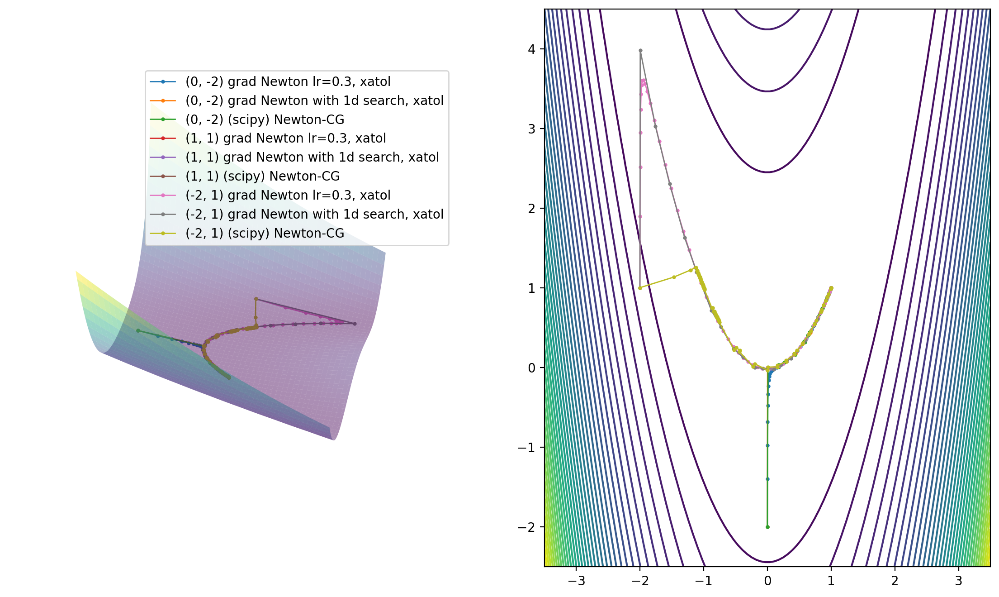

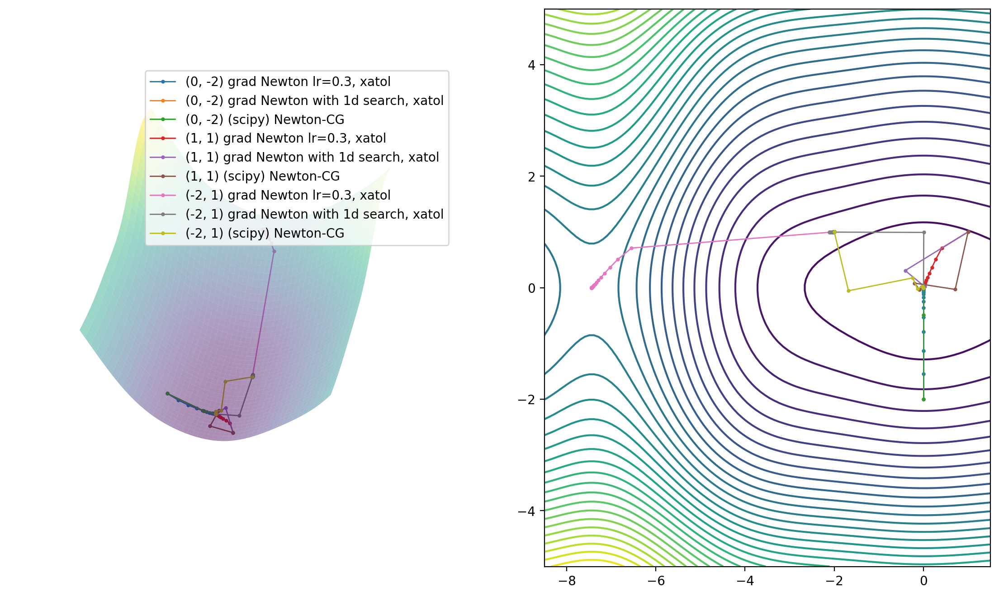

In [10]:
minimize_functions = [partial(minimize.gradient, next_step=step) for step in [
    newton_step.learning_rate(0.3),
    newton_step.search(),
]]
minimize_functions += [minimize.newton_cg]

plotters = [
    plotter(f1).figure().plot3d(radius=3.5, center=(0, 1)),
    plotter(f2).figure().plot3d(radius=5, center=(-3.5, 0))
]
for f, p in zip([f1, f2], plotters):
    t = table()
    for point in [(0, -2), (1, 1), (-2, 1)]:
        for minimize_func in minimize_functions:
            for eps in [1e-4, 1e-5]:
                result = minimize_func(f, point, eps)
                if eps == 0.00001:
                    p.plot_steps(result.steps, l=f'({util.format_point(point)}) {result.method}')
                t.add_row(result.row())
    t.display()

Мы сравнили нашу реализацию метода Ньютона с реализацией в scipy.

- Постоянный шаг:

В процессе нашего исследования мы экспериментировали с различными настройками алгоритма оптимизации, такими как точность, начальная точка, тип шага. В результате было обнаружено, что для относительно простых функций возможно определить оптимальный шаг, что позволяет ускорить процесс оптимизации.

Однако, если размер шага выбран неправильно, это может привести к существенному увеличению количества итераций или даже сделать невозможным достижение минимума, так как мы можем прыгнуть слишком далеко и попасть в другой локальный минимум или максимум. 

Такой эффект связан с тем, что при фиксированном значении шага неправильный выбор может привести к зацикливанию процесса оптимизации или попаданию в другие экстремумы, поскольку величина шага в формуле играет ключевую роль.

- Одномерный поиск:

С помощью одномерного поиска удалось найти минимум во всех рассмотренных случаях, но этот метод оказался очень плохим по количеству вычислений функции, её градиента и гессиана.

- Newton-CG (scipy):

Библиотечная реализация показала наилучший результат.
Минимум удалось найти во всех случаях и за приемлимое число вычислений.


#### Сравнии эффективность методов нулевого порядка и градиентного спуска, метода Ньютона, квазиньютоновских методов

|    | func                                                        | x0    | optimum            |   deviation | iter   |   evals |    eps | method                     |
|---:|:------------------------------------------------------------|:------|:-------------------|------------:|:-------|--------:|-------:|:---------------------------|
|  0 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 0, -2 | 1.00e+00, 1.00e+00 |    3.07e-06 | 91     |     175 | 1e-04  | (scipy) Nelder-Mead        |
|  1 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 0, -2 | 1.00e+00, 1.00e+00 |    4.3e-06  | 99     |     190 | 1e-05  | (scipy) Nelder-Mead        |
|  2 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 0, -2 | none               |  inf        | >700   |   16077 | 1e-04  | grad with 1d search, xatol |
|  3 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 0, -2 | none               |  inf        | >700   |   18873 | 1e-05  | grad with 1d search, xatol |
|  4 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 0, -2 | 9.99e-01, 9.98e-01 |    0.00184  | 29     |     103 | 1e-04  | (scipy) Newton-CG          |
|  5 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 0, -2 | 1.00e+00, 1.00e+00 |    1.82e-06 | 31     |     109 | 1e-05  | (scipy) Newton-CG          |
|  6 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 0, -2 | 1.00e+00, 1.00e+00 |    5.78e-05 | 27     |     175 | 1e-04  | (scipy) BFGS 3-point       |
|  7 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 0, -2 | 1.00e+00, 1.00e+00 |    5.51e-08 | 28     |     180 | 1e-05  | (scipy) BFGS 3-point       |
|  8 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 1, 1  | 1.00e+00, 1.00e+00 |    0        | 24     |      49 | 1e-04  | (scipy) Nelder-Mead        |
|  9 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 1, 1  | 1.00e+00, 1.00e+00 |    0        | 31     |      63 | 1e-05  | (scipy) Nelder-Mead        |
| 10 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 1, 1  | 1.00e+00, 1.00e+00 |    0        | 1      |      23 | 1e-04  | grad with 1d search, xatol |
| 11 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 1, 1  | 1.00e+00, 1.00e+00 |    0        | 1      |      27 | 1e-05  | grad with 1d search, xatol |
| 12 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 1, 1  | 1.00e+00, 1.00e+00 |    0        | 1      |       3 | 1e-04  | (scipy) Newton-CG          |
| 13 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 1, 1  | 1.00e+00, 1.00e+00 |    0        | 1      |       3 | 1e-05  | (scipy) Newton-CG          |
| 14 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 1, 1  | 1.00e+00, 1.00e+00 |    0        | 0      |       5 | 1e-04  | (scipy) BFGS 3-point       |
| 15 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 1, 1  | 1.00e+00, 1.00e+00 |    0        | 0      |       5 | 1e-05  | (scipy) BFGS 3-point       |
| 16 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | -2, 1 | 1.00e+00, 1.00e+00 |    6.19e-05 | 108    |     203 | 1e-04  | (scipy) Nelder-Mead        |
| 17 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | -2, 1 | 1.00e+00, 1.00e+00 |    2.04e-06 | 116    |     219 | 1e-05  | (scipy) Nelder-Mead        |
| 18 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | -2, 1 | none               |  inf        | >700   |   16077 | 1e-04  | grad with 1d search, xatol |
| 19 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | -2, 1 | none               |  inf        | >700   |   18873 | 1e-05  | grad with 1d search, xatol |
| 20 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | -2, 1 | 1.00e+00, 1.00e+00 |    0.000128 | 93     |     315 | 1e-04  | (scipy) Newton-CG          |
| 21 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | -2, 1 | 1.00e+00, 1.00e+00 |    8.72e-09 | 95     |     321 | 1e-05  | (scipy) Newton-CG          |
| 22 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | -2, 1 | 1.00e+00, 1.00e+00 |    1.58e-07 | 34     |     225 | 1e-04  | (scipy) BFGS 3-point       |
| 23 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | -2, 1 | 1.00e+00, 1.00e+00 |    1.58e-07 | 34     |     225 | 1e-05  | (scipy) BFGS 3-point       |

|    | func                                                                                           | x0    | optimum              |   deviation |   iter |   evals |    eps | method                     |
|---:|:-----------------------------------------------------------------------------------------------|:------|:---------------------|------------:|-------:|--------:|-------:|:---------------------------|
|  0 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 0, -2 | -4.60e-05, -1.70e-05 |    4.91e-05 |     37 |      70 | 1e-04  | (scipy) Nelder-Mead        |
|  1 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 0, -2 | 9.31e-07, -3.34e-06  |    3.46e-06 |     44 |      84 | 1e-05  | (scipy) Nelder-Mead        |
|  2 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 0, -2 | 0.00e+00, -3.49e-13  |    3.49e-13 |      3 |      69 | 1e-04  | grad with 1d search, xatol |
|  3 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 0, -2 | 0.00e+00, 1.72e-16   |    1.72e-16 |      3 |      81 | 1e-05  | grad with 1d search, xatol |
|  4 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 0, -2 | 0.00e+00, 3.93e-09   |    3.93e-09 |      4 |      14 | 1e-04  | (scipy) Newton-CG          |
|  5 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 0, -2 | 0.00e+00, 2.31e-18   |    2.31e-18 |      5 |      17 | 1e-05  | (scipy) Newton-CG          |
|  6 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 0, -2 | 0.00e+00, -5.59e-07  |    5.59e-07 |      5 |      30 | 1e-04  | (scipy) BFGS 3-point       |
|  7 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 0, -2 | 0.00e+00, 2.00e-11   |    2e-11    |      6 |      35 | 1e-05  | (scipy) BFGS 3-point       |
|  8 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 1, 1  | 4.91e-05, -9.21e-06  |    5e-05    |     42 |      82 | 1e-04  | (scipy) Nelder-Mead        |
|  9 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 1, 1  | 1.22e-06, 1.61e-06   |    2.02e-06 |     50 |      97 | 1e-05  | (scipy) Nelder-Mead        |
| 10 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 1, 1  | 8.41e-06, -9.44e-07  |    8.46e-06 |      9 |     207 | 1e-04  | grad with 1d search, xatol |
| 11 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 1, 1  | 8.37e-07, 1.19e-06   |    1.46e-06 |     10 |     270 | 1e-05  | grad with 1d search, xatol |
| 12 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 1, 1  | -1.51e-21, 2.65e-13  |    2.65e-13 |      8 |      26 | 1e-04  | (scipy) Newton-CG          |
| 13 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 1, 1  | -1.51e-21, 2.65e-13  |    2.65e-13 |      8 |      26 | 1e-05  | (scipy) Newton-CG          |
| 14 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 1, 1  | 2.54e-06, 2.97e-06   |    3.9e-06  |      7 |      45 | 1e-04  | (scipy) BFGS 3-point       |
| 15 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 1, 1  | 4.08e-08, 1.80e-10   |    4.08e-08 |      8 |      50 | 1e-05  | (scipy) BFGS 3-point       |
| 16 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | -2, 1 | -1.99e-05, 1.30e-05  |    2.38e-05 |     46 |      87 | 1e-04  | (scipy) Nelder-Mead        |
| 17 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | -2, 1 | 1.48e-06, -3.65e-06  |    3.94e-06 |     52 |      99 | 1e-05  | (scipy) Nelder-Mead        |
| 18 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | -2, 1 | -4.60e-06, 6.11e-06  |    7.64e-06 |     10 |     230 | 1e-04  | grad with 1d search, xatol |
| 19 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | -2, 1 | -2.63e-06, -3.16e-07 |    2.65e-06 |     11 |     297 | 1e-05  | grad with 1d search, xatol |
| 20 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | -2, 1 | -1.34e-18, 7.75e-14  |    7.75e-14 |      7 |      25 | 1e-04  | (scipy) Newton-CG          |
| 21 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | -2, 1 | -1.34e-18, 7.75e-14  |    7.75e-14 |      7 |      25 | 1e-05  | (scipy) Newton-CG          |
| 22 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | -2, 1 | -1.54e-09, 3.43e-07  |    3.43e-07 |      5 |      40 | 1e-04  | (scipy) BFGS 3-point       |
| 23 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | -2, 1 | -1.54e-09, 3.43e-07  |    3.43e-07 |      5 |      40 | 1e-05  | (scipy) BFGS 3-point       |

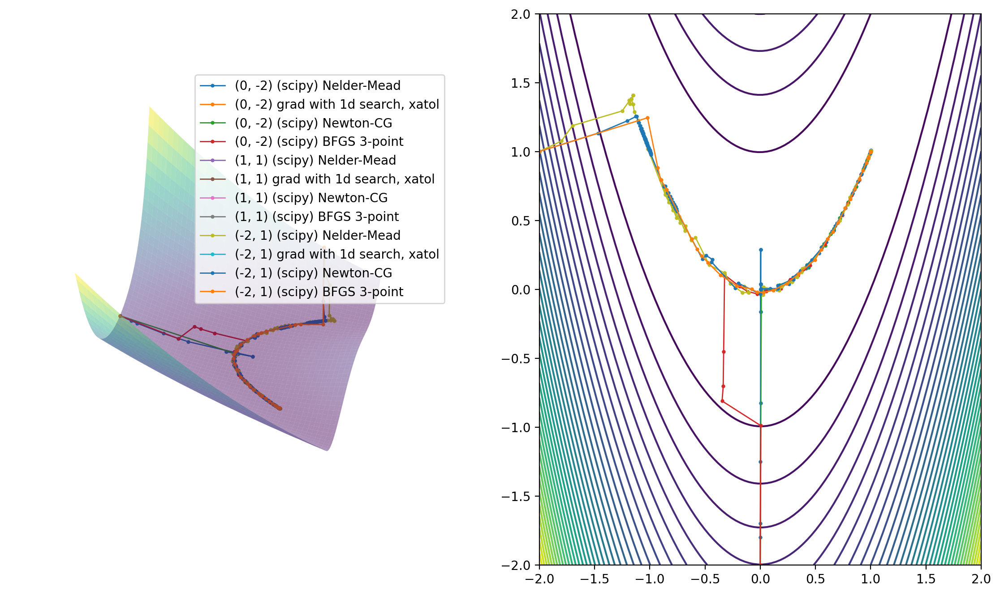

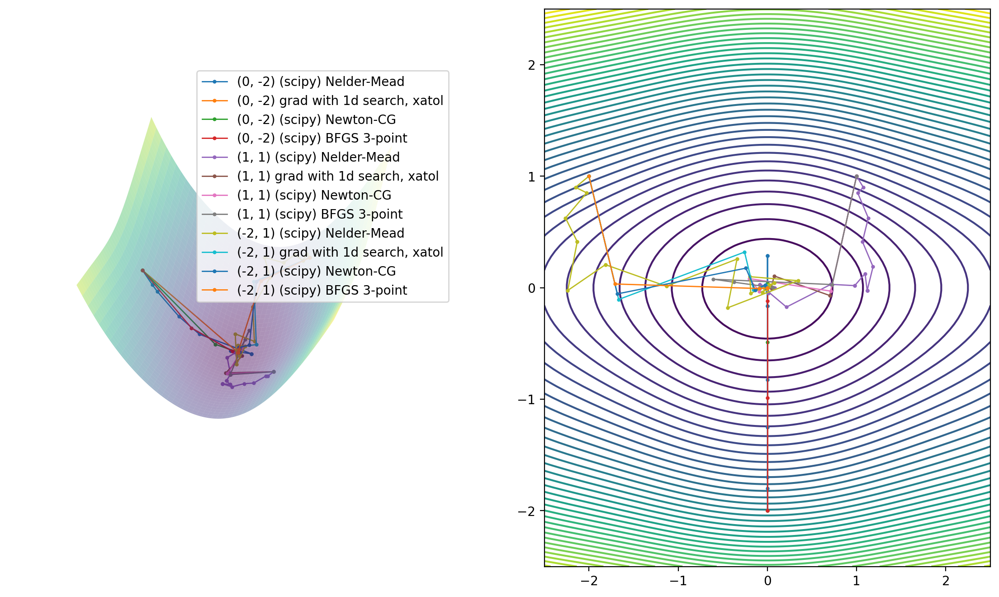

In [24]:
minimize_functions = [
    minimize.nelder_mead,
    partial(minimize.gradient, maxiter=700),
    minimize.newton_cg,
    minimize.bfgs,
]

plotters = [
    plotter(f1).figure().plot3d(radius=2, center=(0, 0)),
    plotter(f2).figure().plot3d(radius=2.5, center=(0, 0))
]
for f, p in zip([f1, f2], plotters):
    t = table()
    for point in [(0, -2), (1, 1), (-2, 1)]:
        for minimize_func in minimize_functions:
            for eps in [0.0001, 0.00001]:
                result = minimize_func(f, point, eps)
                if eps == 0.00001:
                    p.plot_steps(result.steps, l=f'({util.format_point(point)}) {result.method}')
                t.add_row(result.row())
    t.display()

Сравним несколько строк

In [12]:
minimize_functions = [
    minimize.nelder_mead,
    partial(minimize.gradient, maxiter=700),
    minimize.newton_cg,
    minimize.bfgs,
]
t = table()
for minimize_func in minimize_functions:
    t.add_row(minimize_func(f2, (-2, 1), 1e-5).row())
t.display()

|    | func                                                                                           | x0    | optimum              |   deviation |   iter |   evals |   eps | method                     |
|---:|:-----------------------------------------------------------------------------------------------|:------|:---------------------|------------:|-------:|--------:|------:|:---------------------------|
|  0 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | -2, 1 | 1.48e-06, -3.65e-06  |    3.94e-06 |     52 |      99 | 1e-05 | (scipy) Nelder-Mead        |
|  1 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | -2, 1 | -2.63e-06, -3.16e-07 |    2.65e-06 |     11 |     297 | 1e-05 | grad with 1d search, xatol |
|  2 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | -2, 1 | -1.34e-18, 7.75e-14  |    7.75e-14 |      7 |      25 | 1e-05 | (scipy) Newton-CG          |
|  3 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | -2, 1 | -1.54e-09, 3.43e-07  |    3.43e-07 |      5 |      40 | 1e-05 | (scipy) BFGS 3-point       |

Видно, что лучшим методом в данном случае оказался Newton-CG, потому что он использует максимальное количество информации о функции и более эффективного использует информацию о кривизне поверхности.

Метод градиентного спуска с одномерным поиском проиграл показал худший результат, потому что из-за нестабильного градиента каждый раз сбивалось направление к минимуму.

Метод Нелдера-Мида и BFGS показали средний результат. С одной стороны их направление не так сильно сбивается, как у градиентного спуска, но с другой – они имеют меньше информации о функции, из-за чего им требуются лишние вызовы для работы, например, для аппроксимации гессиана в точке.

#### Сравним эффективность методов нулевого порядка и квазиньютоновскими с раностным методом

|    | func                                                        | x0    | optimum            |   deviation |   iter |   evals |   eps | method               |
|---:|:------------------------------------------------------------|:------|:-------------------|------------:|-------:|--------:|------:|:---------------------|
|  0 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 0, -2 | 1.00e+00, 1.00e+00 |    4.3e-06  |     99 |     190 | 1e-05 | (scipy) Nelder-Mead  |
|  1 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 0, -2 | 1.00e+00, 1.00e+00 |    8.1e-06  |     27 |     102 | 1e-05 | (scipy) BFGS 2-point |
|  2 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 0, -2 | 1.00e+00, 1.00e+00 |    5.51e-08 |     28 |     180 | 1e-05 | (scipy) BFGS 3-point |
|  3 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | -2, 1 | 1.00e+00, 1.00e+00 |    2.04e-06 |    116 |     219 | 1e-05 | (scipy) Nelder-Mead  |
|  4 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | -2, 1 | 1.00e+00, 1.00e+00 |    1e-05    |     34 |     135 | 1e-05 | (scipy) BFGS 2-point |
|  5 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | -2, 1 | 1.00e+00, 1.00e+00 |    1.58e-07 |     34 |     225 | 1e-05 | (scipy) BFGS 3-point |

|    | func                                                                                           | x0    | optimum              |   deviation |   iter |   evals |   eps | method               |
|---:|:-----------------------------------------------------------------------------------------------|:------|:---------------------|------------:|-------:|--------:|------:|:---------------------|
|  0 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 0, -2 | 9.31e-07, -3.34e-06  |    3.46e-06 |     44 |      84 | 1e-05 | (scipy) Nelder-Mead  |
|  1 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 0, -2 | -2.52e-08, -5.14e-08 |    5.73e-08 |      7 |      27 | 1e-05 | (scipy) BFGS 2-point |
|  2 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 0, -2 | 0.00e+00, 2.00e-11   |    2e-11    |      6 |      35 | 1e-05 | (scipy) BFGS 3-point |
|  3 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | -2, 1 | 1.48e-06, -3.65e-06  |    3.94e-06 |     52 |      99 | 1e-05 | (scipy) Nelder-Mead  |
|  4 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | -2, 1 | -8.99e-09, 3.50e-07  |    3.5e-07  |      5 |      24 | 1e-05 | (scipy) BFGS 2-point |
|  5 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | -2, 1 | -1.54e-09, 3.43e-07  |    3.43e-07 |      5 |      40 | 1e-05 | (scipy) BFGS 3-point |

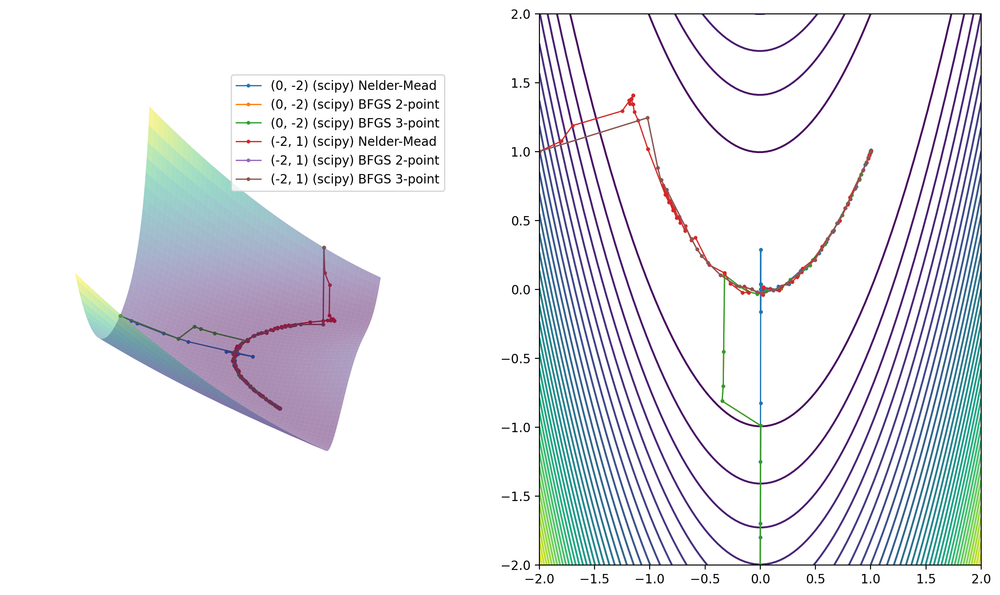

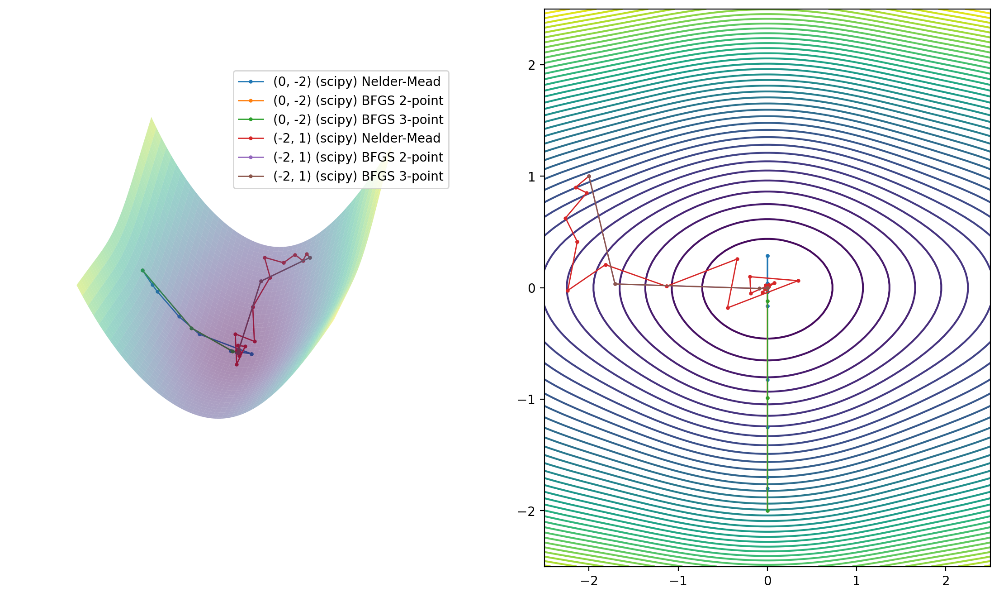

In [13]:
minimize_functions = [minimize.nelder_mead] + [
    partial(minimize.bfgs, jac=jac) for jac in ["2-point", "3-point"]
]

plotters = [
    plotter(f1).figure().plot3d(radius=2, center=(0, 0)),
    plotter(f2).figure().plot3d(radius=2.5, center=(0, 0))
]
for f, p in zip([f1, f2], plotters):
    t = table()
    for point in [(0, -2), (-2, 1)]:
        for minimize_func in minimize_functions:
            for eps in [0.00001]:
                result = minimize_func(f, point, eps)
                if eps == 0.00001:
                    p.plot_steps(result.steps, l=f'({util.format_point(point)}) {result.method}')
                t.add_row(result.row())
    t.display()

В scipy разные способы аппроксимации производной

- 2-point: использует две точки для аппроксимации производной функции.

$$f'(x) \approx \frac{f(x+h)-f(x)}{h} $$

- 3-point: использует три точки для аппроксимации производной, что обеспечивает более высокую точность.

$$f'(x) \approx \frac{f(x+h)-f(x-h)}{2h} $$

По таблице заметно, что c методом 3-point число вычислений функции было примерно в 2 раза больше, но в то же время точность получилась немного выше.

Метод Нелдера-Мида в вычислял функцию либо сколько же раз, как BFGS 3-point, либо в несколько раз больше.

### Дополнительное задание 1

Мы реализовали одномерный поиск по правилу Вольфе и метод Ньютона на его основе.

|    | func                                                        | x0    | optimum            |   deviation |   iter |   evals |   eps | method                                         |
|---:|:------------------------------------------------------------|:------|:-------------------|------------:|-------:|--------:|------:|:-----------------------------------------------|
|  0 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 1, 1  | 1.00e+00, 1.00e+00 |    0        |      1 |       2 | 1e-05 | grad Newton with Wolf c1=0.0001, c2=0.9, xatol |
|  1 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 1, 1  | 1.00e+00, 1.00e+00 |    0        |      1 |       2 | 1e-05 | grad Newton lr=0.3, xatol                      |
|  2 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 1, 1  | 1.00e+00, 1.00e+00 |    0        |      1 |      54 | 1e-05 | grad Newton with 1d search, xatol              |
|  3 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | 1, 1  | 1.00e+00, 1.00e+00 |    0        |      1 |       3 | 1e-05 | (scipy) Newton-CG                              |
|  4 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | -2, 1 | 1.00e+00, 1.00e+00 |    1.76e-07 |     25 |     171 | 1e-05 | grad Newton with Wolf c1=0.0001, c2=0.9, xatol |
|  5 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | -2, 1 | 1.00e+00, 1.00e+00 |    1.65e-05 |     82 |     164 | 1e-05 | grad Newton lr=0.3, xatol                      |
|  6 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | -2, 1 | 1.00e+00, 1.00e+00 |    4.83e-14 |     26 |    1404 | 1e-05 | grad Newton with 1d search, xatol              |
|  7 | $\left(1 - x\right)^{2} + 100 \left(- x^{2} + y\right)^{2}$ | -2, 1 | 1.00e+00, 1.00e+00 |    8.72e-09 |     95 |     321 | 1e-05 | (scipy) Newton-CG                              |

|    | func                                                                                           | x0    | optimum             |   deviation |   iter |   evals |   eps | method                                         |
|---:|:-----------------------------------------------------------------------------------------------|:------|:--------------------|------------:|-------:|--------:|------:|:-----------------------------------------------|
|  0 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 1, 1  | 8.75e-15, 0.00e+00  |    8.75e-15 |      7 |      38 | 1e-05 | grad Newton with Wolf c1=0.0001, c2=0.9, xatol |
|  1 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 1, 1  | 8.60e-06, 1.80e-05  |    2e-05    |     31 |      62 | 1e-05 | grad Newton lr=0.3, xatol                      |
|  2 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 1, 1  | -2.84e-16, 2.66e-15 |    2.67e-15 |      5 |     270 | 1e-05 | grad Newton with 1d search, xatol              |
|  3 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | 1, 1  | -1.51e-21, 2.65e-13 |    2.65e-13 |      8 |      26 | 1e-05 | (scipy) Newton-CG                              |
|  4 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | -2, 1 | -2.00e+00, 1.00e+00 |    2.24     |      1 |      65 | 1e-05 | grad Newton with Wolf c1=0.0001, c2=0.9, xatol |
|  5 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | -2, 1 | -7.44e+00, 1.26e-05 |    7.44     |     32 |      64 | 1e-05 | grad Newton lr=0.3, xatol                      |
|  6 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | -2, 1 | -8.60e-24, 2.74e-14 |    2.74e-14 |    797 |   43038 | 1e-05 | grad Newton with 1d search, xatol              |
|  7 | $x^{2} \left(\cos{\left(x \right)} + 3\right) + y^{2} \left(\sin{\left(y \right)} + 10\right)$ | -2, 1 | -1.34e-18, 7.75e-14 |    7.75e-14 |      7 |      25 | 1e-05 | (scipy) Newton-CG                              |

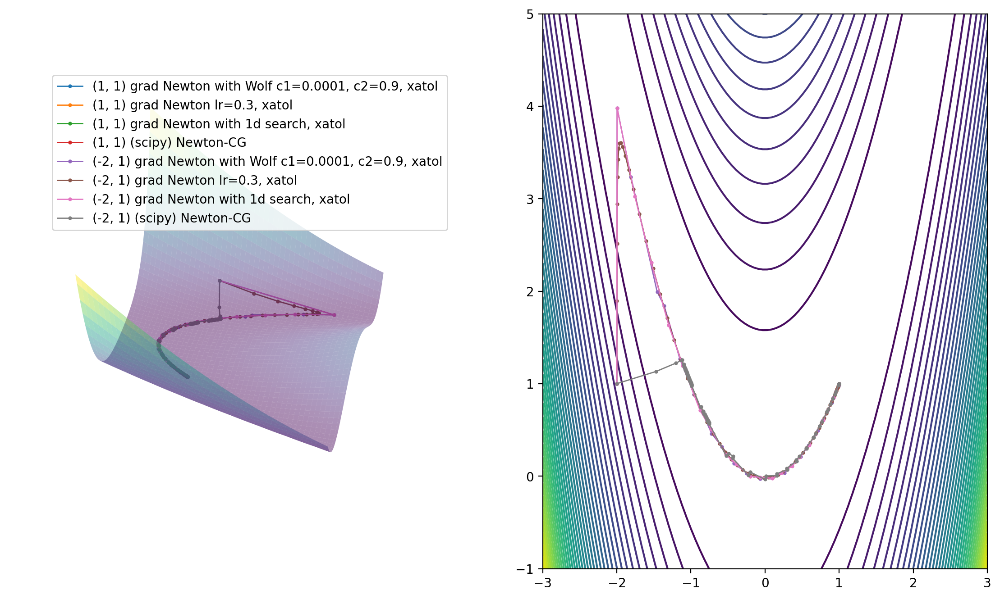

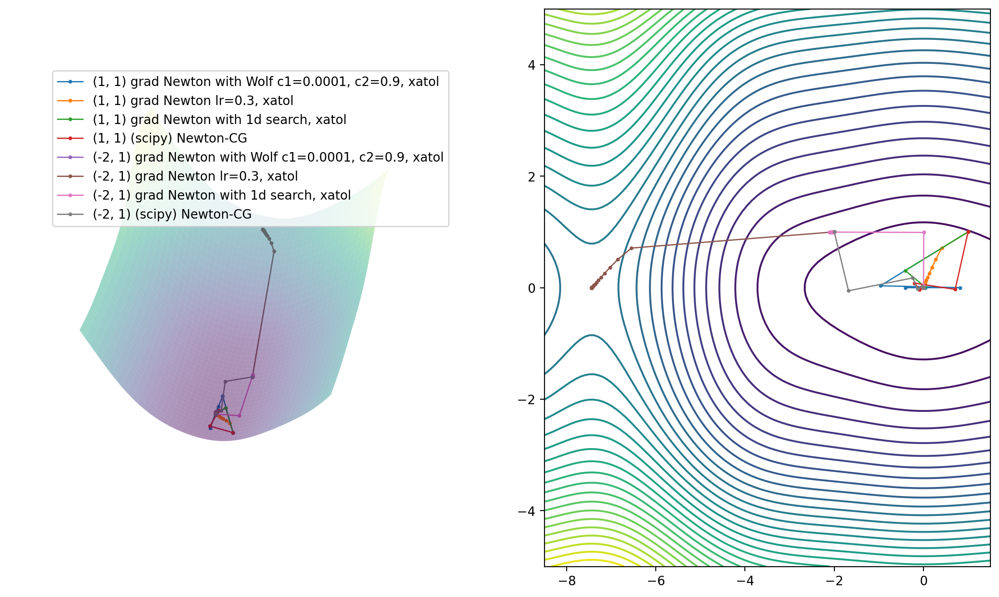

In [14]:
minimize_functions = [partial(minimize.gradient, next_step=step) for step in [
    newton_step.wolf(),
    newton_step.learning_rate(0.3),
    newton_step.search(),
]]
minimize_functions += [minimize.newton_cg]

plotters = [
    plotter(f1).figure().plot3d(radius=3, center=(0, 2)),
    plotter(f2).figure().plot3d(radius=5, center=(-3.5, 0))
]
for f, p in zip([f1, f2], plotters):
    t = table()
    for point in [(1, 1), (-2, 1)]:
        for minimize_func in minimize_functions:
            for eps in [0.00001]:
                result = minimize_func(f, point, eps)
                if eps == 0.00001:
                    p.plot_steps(result.steps, l=f'({util.format_point(point)}) {result.method}')
                t.add_row(result.row())
    t.display()

Поиск по правилу Вольфе оказался самым быстрым из наших методов, но Newton-CG из scipy всё равно испозьзует в несколько раз меньше вычислений.

### Дополнительное задание 2


##### Найдём функцию, для которой метод Ньютона не работает для некоторой начальной точки

$$f(x, y) = x^6 + y^6 - x^2y^2$$

Начальная точка: $(0, 0)$

LinAlgError: Singular matrix

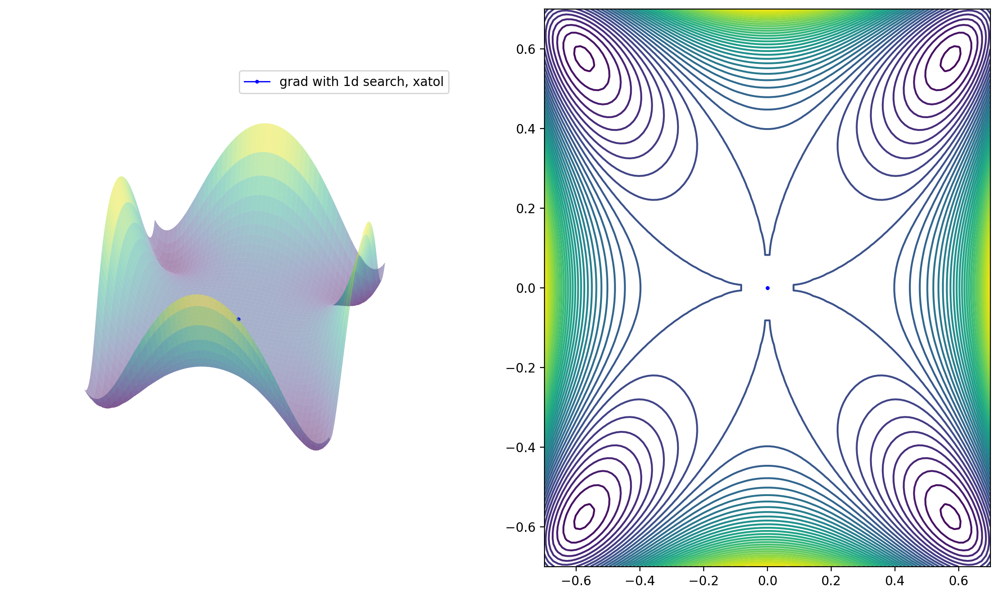

In [15]:
f_dop1 = sp.sympify("x**6 + y**6 - x**2*y**2")
p = plotter(f_dop1).figure().plot3d(center=(0, 0), radius=0.7)

res = minimize.gradient(f_dop1, (0, 0), eps=0.0001)
p.plot_steps(res.steps, l=res.method, color="blue")

res = minimize.gradient(f_dop1, (0, 0), eps=0.0001, next_step=newton_step.learning_rate())
p.plot_steps(res.steps, l=res.method, color="red")

Метод Ньютона не смог посчитать обратный гессиан в точке $(0, 0)$, потому что это седловая точка.

В седловой точке функции гессиан имеет как положительные, так и отрицательные собственные значения, что приводит к тому, что определитель равен нулю.
В такой точке метод Ньютона не может найти направление движения.

Градиентный спуск не выдал ошибку, но и не сошёл с начальной точке, потому что вектор градиента в ней равен нулевому вектору.

##### Нйдём пример, где разные методы, из одной начальной точки, сходятся к разным точкам

Возьмём мультимодальную функцию со многими точками локального минимума
$$f(x, y) = -20 \exp\left(-0.2 \sqrt{0.5(x^2 + y^2)}\right) - \exp\left(0.5 (\sin(2 \pi x) + \sin(2 \pi y))\right) + e + 20$$


In [ ]:
f_dop2 = sp.sympify(
    "-20 * exp(-0.2 * (0.5 * sqrt(x ** 2 + y ** 2))) - exp(0.5 * (sin(2 * pi * x) + sin(2 * pi * y))) + exp(1) + 20"
)

|    | func                                                                                                                   | x0                  | optimum              | deviation   |   iter |   evals |   eps | method                  |
|---:|:-----------------------------------------------------------------------------------------------------------------------|:--------------------|:---------------------|:------------|-------:|--------:|------:|:------------------------|
|  0 | $- e^{0.5 \sin{\left(2 \pi x \right)} + 0.5 \sin{\left(2 \pi y \right)}} + e + 20 - 20 e^{- 0.1 \sqrt{x^{2} + y^{2}}}$ | -3.50e-01, 5.00e-01 | -2.73e-01, 1.15e+00  | unknown     |      5 |      10 | 1e-05 | grad Newton lr=1, xatol |
|  1 | $- e^{0.5 \sin{\left(2 \pi x \right)} + 0.5 \sin{\left(2 \pi y \right)}} + e + 20 - 20 e^{- 0.1 \sqrt{x^{2} + y^{2}}}$ | -3.50e-01, 5.00e-01 | -7.26e-01, -7.26e-01 | unknown     |      7 |      65 | 1e-05 | (scipy) BFGS 3-point    |
|  2 | $- e^{0.5 \sin{\left(2 \pi x \right)} + 0.5 \sin{\left(2 \pi y \right)}} + e + 20 - 20 e^{- 0.1 \sqrt{x^{2} + y^{2}}}$ | -3.50e-01, 5.00e-01 | 2.24e-01, 2.24e-01   | unknown     |      9 |      33 | 1e-05 | (scipy) Newton-CG       |
|  3 | $- e^{0.5 \sin{\left(2 \pi x \right)} + 0.5 \sin{\left(2 \pi y \right)}} + e + 20 - 20 e^{- 0.1 \sqrt{x^{2} + y^{2}}}$ | -3.50e-01, 5.00e-01 | -7.17e-01, 2.39e-01  | unknown     |     42 |      80 | 1e-05 | (scipy) Nelder-Mead     |

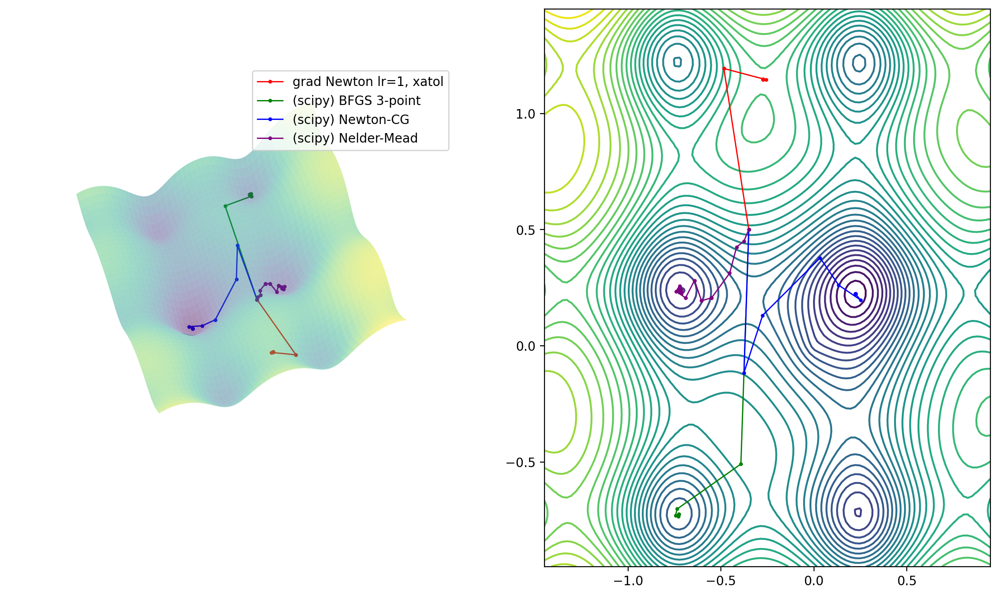

In [ ]:
methods = [
    partial(minimize.gradient, next_step=newton_step.learning_rate()),
    minimize.bfgs,
    minimize.newton_cg,
    minimize.nelder_mead,
]
color = ["red", "green", "blue", "purple"]
p = plotter(f_dop2).figure(angle=(70, 70)).plot3d(center=(-0.25, 0.25), radius=1.2)
t = table()
for m, col in zip(methods, color):
    result = m(f_dop2, (-0.35, 0.5), 0.00001)
    p.plot_steps(result.steps, l=result.method, color=col)
    t.add_row(result.row())

t.display()

Все методы сошлись к разным точкам.

- Наша реализация метода Ньютона не пришла к минимуму, потому что застряла в седле.

- Метод Нелдера-Мида сразу пошёл в сторону ближайшего локального минимума.

- Метод Newton-CG сначала сделал большой прыжок в направлении убывания, а затем продолжил идти по направлению убывания в сторону минимума.

- Метод BFGS сделал такой же первый прыжок, но затем пошёл против убывания к другому локальному миниуму, возможно, из-за неточности в аппроксимированном гессиане.

## Вывод

В результате нашего исследования мы на практике узнали сильные и слабые стороны разных методов оптимизации и выяснили, в каких ситуациях лучше применять каждый из них.